# scAdam model explainability

Model explainability refers to the ability to understand and articulate how a machine learning model makes its predictions or decisions.

**scNoah** uses [SHAP](https://shap.readthedocs.io/en/latest/index.html) (SHapley Additive exPlanations) for model explainability analysis.

SHAP values are derived from cooperative game theory, specifically using Shapley values, which quantify the contribution of each player (or feature/gene) to the total payoff (or prediction). 
This approach allows for a fair distribution of contributions among features, similar to how players in a coalition share the rewards based on their input.

The SHAP framework operates under the principle that the prediction for an instance can be expressed as the sum of the average prediction and the contributions of each feature. 
Mathematically, this can be represented as:
$$ prediction = f_0 + \sum_{i=1}^M f_i $$
where <br>
$prediction$ is the model's prediction, <br>
$f_0$ is the expected value of the output, <br> 
$f_i$ are the SHAP values for each feature.

SHAP provides a framework for both local explainability and global explainability in machine learning models. <br>

1) **Local Explainability**: Focuses on explaining individual predictions (cells) made by the model. It seeks to clarify why a specific output was generated for a given input. <br>

2) **Global Explainability**: Aims to provide an overall understanding of the model's behavior across all predictions (cells), identifying the main factors that influence outputs.

In [1]:
# Python packages
import warnings
warnings.simplefilter('ignore')

import scanpy as sc
import scparadise
import shap
import os
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd

sc.set_figure_params(dpi = 120)

## Recommendations about dataset 
Our models trained using shifted logarithm normalized data. <br>
We recommend shifted logarithm data normalization method to proper usage of our models: <br>
sc.pp.normalize_total(adata, target_sum=None) <br>
sc.pp.log1p(adata) <br>
adata.raw = adata

In [2]:
# Load dataset from 10x Genomics
url = "https://cf.10xgenomics.com/samples/cell-exp/6.1.0/10k_PBMC_3p_nextgem_Chromium_X/10k_PBMC_3p_nextgem_Chromium_X_filtered_feature_bc_matrix.h5"
adata = sc.read_10x_h5("dataset.h5", backup_url = url)
adata.var_names_make_unique()
adata

100%|█████████████████████████████████████| 37.7M/37.7M [00:00<00:00, 78.4MB/s]


AnnData object with n_obs × n_vars = 11996 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

## QC

In [3]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")

In [4]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

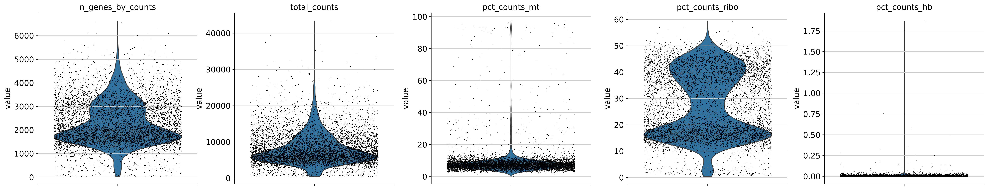

In [5]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", 'pct_counts_ribo', 'pct_counts_hb'],
    jitter=0.4,
    multi_panel=True,
)

In [6]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [7]:
# Detect doublets
sc.pp.scrublet(adata)

In [8]:
# Remove doublets + other QC metrics
adata = adata[adata.obs['predicted_doublet'] == False]
sc.pp.filter_cells(adata, max_genes = 5000)
sc.pp.filter_cells(adata, max_counts = 20000)
adata = adata[adata.obs['pct_counts_mt'] < 15]

## Normalization, HVG, neighbors, PCA, UMAP
We recommend using shifted logarithm data normalization as described here.

In [9]:
# Saving count data
adata.layers["counts"] = adata.X.copy()
# Normalization (shifted logarithm)
sc.pp.normalize_total(adata, target_sum=None)
sc.pp.log1p(adata) 
# scParadise use normalized data in adata.raw!!!
adata.raw = adata
# HVG
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
# PCA
sc.tl.pca(adata)
# Nearest neighbors analysis
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
# UMAP
sc.tl.umap(adata)

## Cell type prediction using scAdam

In [10]:
# Available models for cell type annotation
df = scparadise.scadam.available_models(query = 'PBMC')
df

,Model name,Tissue/Organ,Species,Description,Suspension,Accuracy,Balanced Accuracy,Number of Levels
0,Human_PBMC,blood,human,Peripheral blood mononuclear cells of healthy ...,cells,0.979,0.979,3


In [11]:
# Download model for cell type prediction
scparadise.scadam.download_model('Human_PBMC', save_path='')

In [12]:
# Predict cell types using trained model
adata = scparadise.scadam.predict(
    adata, 
    path_model = 'Human_PBMC_scAdam'
)

Cell type annotation using the 2nd version of the scAdam model
scAdam model with unknown detector loaded from Human_PBMC_scAdam
Gene alignment:
  Model features: 947
  Matched features: 935 (98.7%)


Predicting: 100%|█████████████████████████████| 43/43 [00:00<00:00, 103.71it/s]


Added cell type column: pred_celltype_l1
Added probabilities column: pred_celltype_l1_probability
Added cell type column: pred_celltype_l2
Added probabilities column: pred_celltype_l2_probability
Added cell type column: pred_celltype_l3
Added probabilities column: pred_celltype_l3_probability


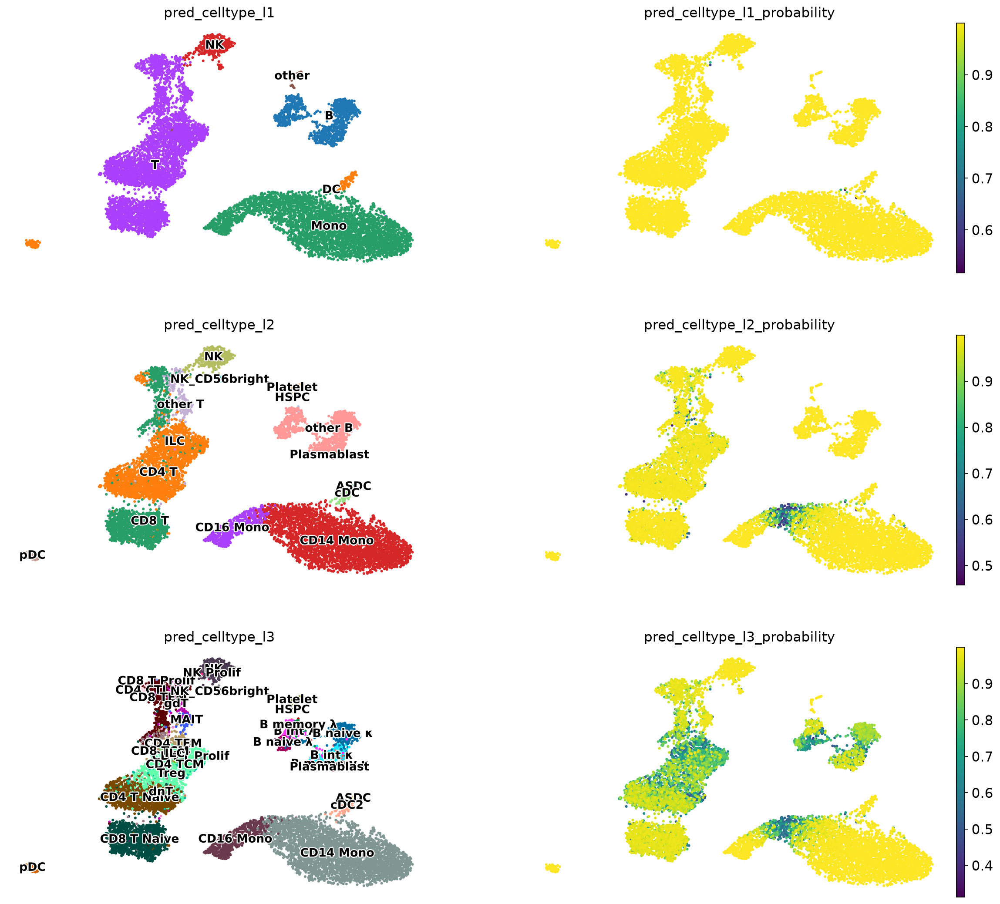

In [14]:
# Visualise predicted cell types levels and prediction probabilities
sc.set_figure_params(figsize=[8, 5])
sc.pl.umap(
    adata, 
    color = [
        'pred_celltype_l1',
        'pred_celltype_l1_probability',
        'pred_celltype_l2',
        'pred_celltype_l2_probability',
        'pred_celltype_l3',
        'pred_celltype_l3_probability'
    ],
    frameon = False,
    legend_loc = 'on data',
    legend_fontsize = 12,
    legend_fontoutline = 2,
    ncols = 2,
    size = 30
)

## Create explanations matrix
Compute [SHAP values](https://shap.readthedocs.io/en/latest/index.html) for a specific cell type predicted using scAdam model.

In [15]:
# Compute explanations for CD8+ T cells
random_state = 0
num_cells = 100
explanations  = scparadise.scnoah.explain(
    adata,
    celltype = 'CD8 T',
    path_model = 'Human_PBMC_scAdam',
    num_cells = num_cells,
    random_state = random_state
)

scAdam model with unknown detector loaded from Human_PBMC_scAdam


PermutationExplainer explainer: 101it [01:59,  1.25s/it]                       

SHAP explanations for cell type 'CD8 T' were completed for 100 cells.


In [20]:
# General explainability
# Calculate gene impoortances
gene_importances = scparadise.scnoah.feature_importance_df(
    explanations
)
# Show 15 most important genes for CD8+ T cells annotation
gene_importances.head(12)

,gene_name,gene_importance,mean_shap_value
0,CCL5,0.045810,0.002262
1,CD8B,0.034693,-0.000737
2,TXK,0.032035,-0.000124
3,GZMA,0.031599,0.000551
4,CD8A,0.028938,-0.001154
5,LINC02446,0.026669,-0.001247
6,ALOX5AP,0.025044,-0.000834
7,CORO1B,0.024495,0.001444
8,NUCB2,0.022090,0.001117
9,AQP3,0.021154,0.000332


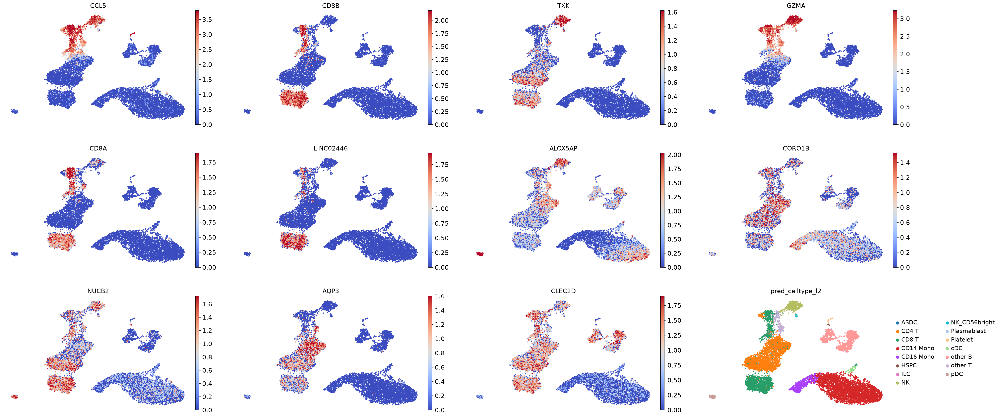

In [25]:
# Visualization of gene importancies on cell embeddings
sc.pl.umap(
    adata,
    color = gene_importances.head(11)['gene_name'].tolist() + ['pred_celltype_l2'],
    frameon = False,
    cmap = 'coolwarm',
    vmax = 'p99',
    size = 30,
    ncols = 4
)

`gene_importances` highlights the importance of CD8A and CD8B for annotating CD8+ T cells, which is biologically expected because both genes are canonical CD8+ T-cell markers.

Several highly ranked genes are also associated with distinct CD8+ T-cell states. GZMK, GZMA, CCL5, NKG7, and KLRD1 are commonly expressed by `memory and cytotoxic/effector CD8+ T-cell` populations, whereas IL7R and CCR7 are characteristic of `naïve and central-memory-like CD8+ T cells`. Thus, the gene-importance results capture both the core CD8+ T-cell identity and transcriptional differences among CD8+ T-cell subtypes.

## Analysis of explanations
1) **Positive** SHAP value indicates that a feature (gene) increases the model’s output for the cell type being explained, relative to the model’s baseline prediction.
2) **Negative** SHAP value indicates that the feature (gene) decreases that output.

In other words, for a specific cell and target cell type, a gene with a positive SHAP value supports the predicted label, whereas a gene with a negative SHAP value argues against it. The magnitude of the SHAP value reflects the strength of that contribution—not necessarily the gene’s overall biological importance. SHAP values are local, instance-specific contributions that collectively explain the difference between an individual prediction and the model’s expected baseline output.

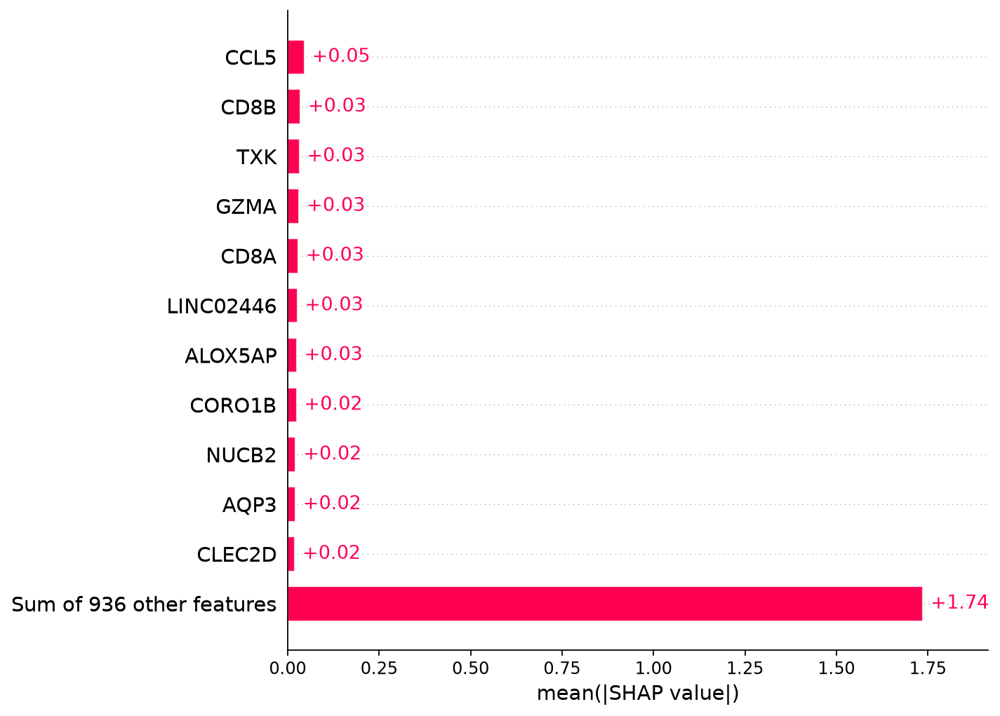

In [29]:
# Visualize feature explanations.
# The bar plot shows the genes with the greatest overall importance
# for CD8+ T-cell annotation.
plt.grid(visible=False, axis="both")
shap.plots.bar(explanations, max_display=12)

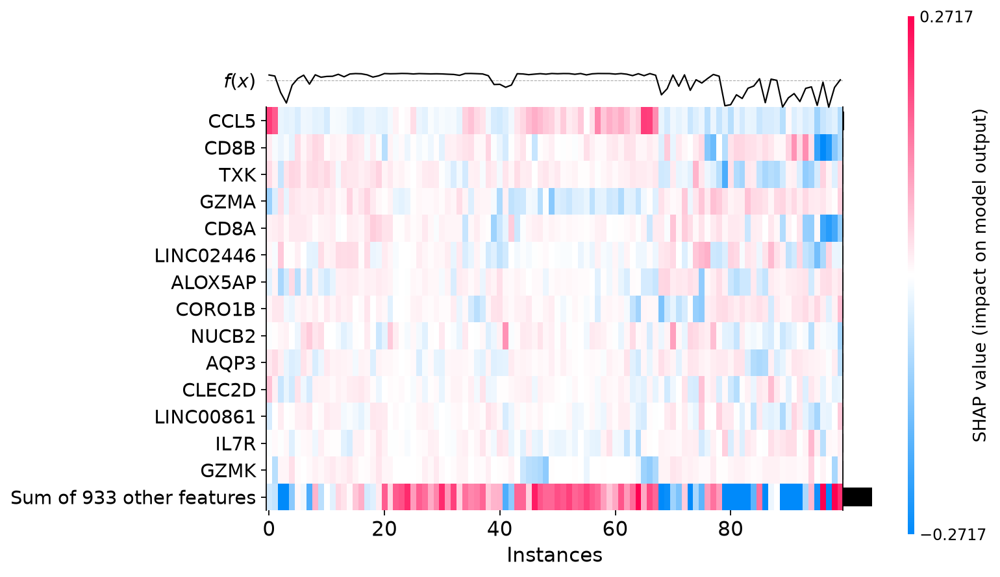

In [30]:
# Visualize SHAP values for individual cells.
shap.plots.heatmap(explanations, max_display=15, show=False)
plt.grid(visible=False, axis="both")

The `bar plot` shows the genes with the greatest overall contribution to CD8+ T-cell annotation. <br>
The `heatmap` displays SHAP values for individual cells, allowing inspection of how each gene contributes to the predicted CD8+ T-cell label for each cell.

### Difference between CD8+ T cells
Differences in SHAP values suggest the presence of at least two distinct groups of CD8+ T cells:

1) Cells with positive SHAP values for `CCL5` and negative SHAP values for `GZMK`.
2) Cells with positive or zero SHAP values for `GZMK` and negative or zero SHAP values for `CCL5`.

For individual cells, SHAP values can be displayed together with gene-expression levels.

<div class="alert alert-warning">
    <b>Warning!</b><br>
    <code>shap.plots.heatmap()</code> performs hierarchical clustering automatically.<br>
    To identify the cell corresponding to a position in the heatmap, perform the same clustering on <code>explanations</code>:<br>
    <code>cluster_order = explanations.hclust()</code><br>
    You can then use the instance number displayed by <code>shap.plots.heatmap()</code> together with <code>cluster_order</code> to identify the corresponding cell in the original <code>explanations</code> object.
</div>

np.int32(29)

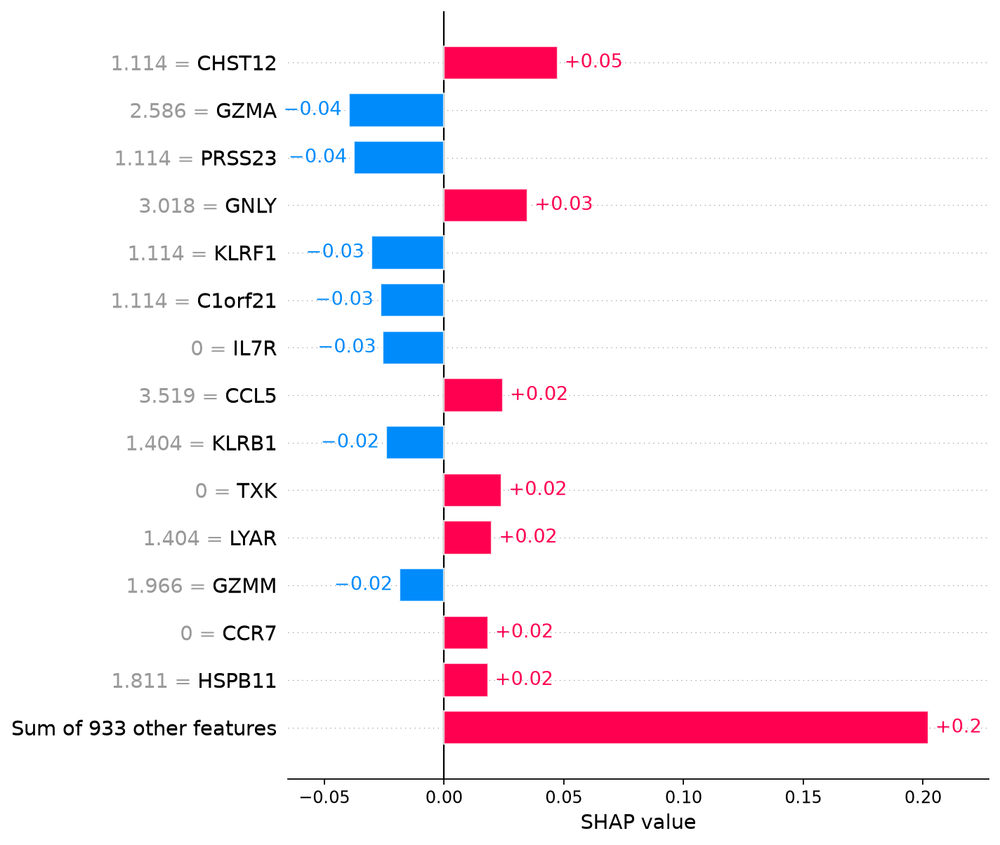

In [45]:
# Memory CD8+ T cell
# The numbers shown to the left of the gene names represent gene-expression values.
# `explanations.hclust()[1]` maps the second cell in the heatmap ordering
# to its index in the original `explanations` object.
cell_index = explanations.hclust()[50]

shap.plots.bar(
    explanations[cell_index],
    max_display=15,
    show=False,
)
plt.grid(visible=False, axis="both")

# Index of the corresponding cell in the original explanations object
cell_index

np.int32(62)

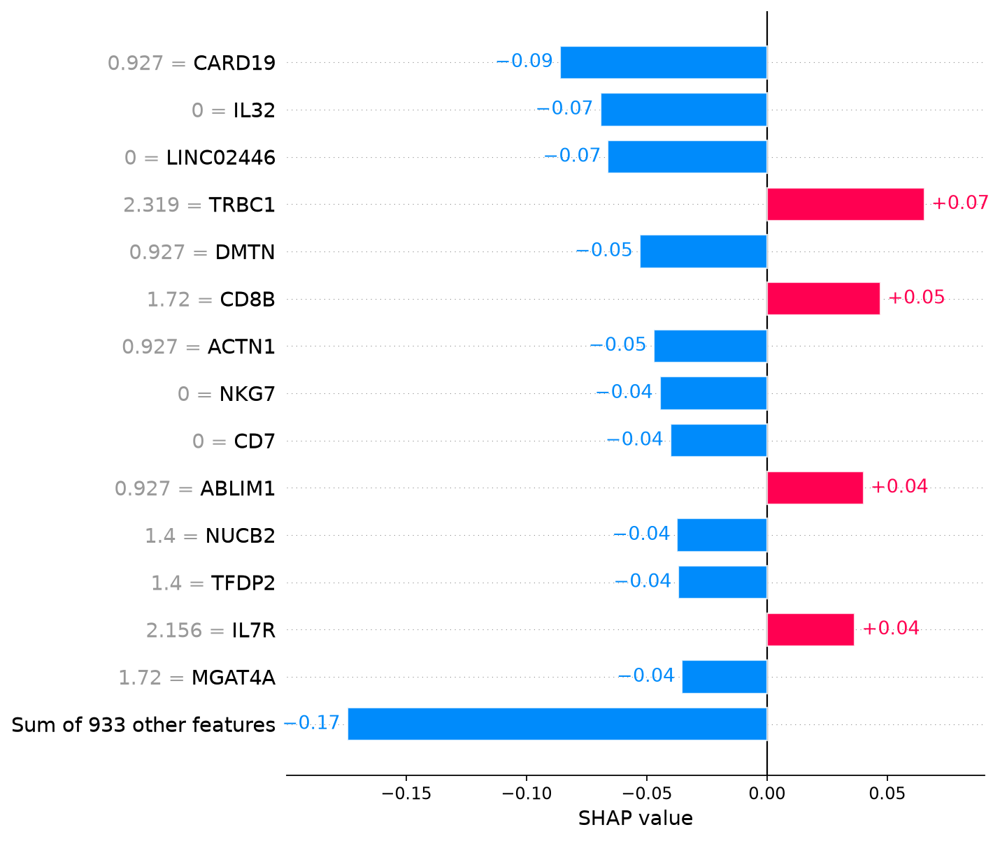

In [38]:
# Naïve CD8+ T cell
# The numbers shown to the left of the gene names represent gene-expression values.
# `explanations.hclust()[90]` maps the 91st cell in the heatmap ordering
# to its index in the original `explanations` object.
cell_index = explanations.hclust()[90]

shap.plots.bar(
    explanations[cell_index],
    max_display=15,
    show=False,
)
plt.grid(visible=False, axis="both")

# Index of the corresponding cell in the original explanations object
cell_index

The left-hand numbers next to gene names represent the gene-expression values for the selected cell. The bars show the SHAP values: positive values increase the model output for the explained CD8+ T-cell prediction, whereas negative values decrease it.

In this example, explanations.hclust()[1] retrieves the index of the second cell in the hierarchical-clustering order used by the heatmap. This index identifies the corresponding cell in the original explanations object.

In [39]:
# Extract the same 100 cells from a dataset
adata_subset = adata[adata.obs['pred_celltype_l2'] == 'CD8 T'].copy()
indexes = pd.DataFrame(index = adata_subset.obs_names).sample(n = num_cells, axis = 0, random_state = random_state).index.tolist()
adata_subset = adata_subset[indexes]

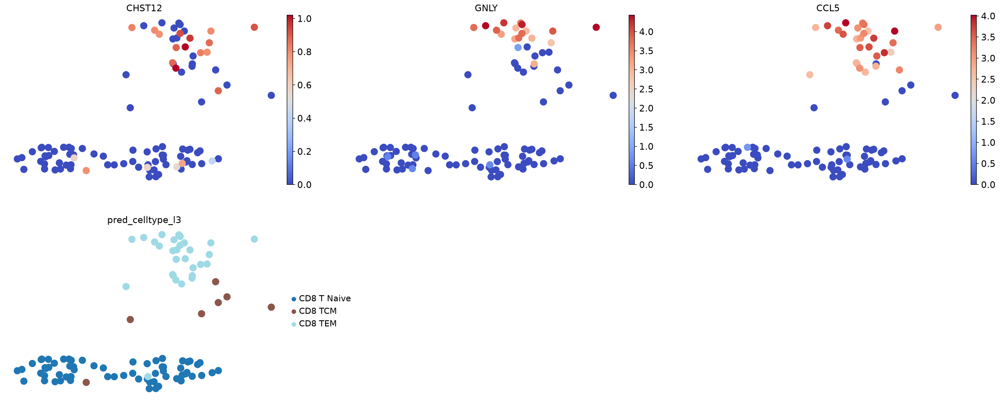

In [50]:
# Visualization of gene importances on cell embeddings
# CD8 TCM - central memory
# CD8 TEM - effector memory
sc.pl.embedding(
    adata_subset,
    color = [
        'CHST12', 
        'GNLY',
        'CCL5',
        'pred_celltype_l3'
    ],
    basis = 'X_umap',
    frameon = False,
    legend_loc = 'right margin',
    palette = 'tab20',
    vmax = 'p99',
    cmap = 'coolwarm',
    ncols = 3,
    size = 500
)

## Marker gene search based on gene importances

In [51]:
# Compute explanations for plasmacytoid dendritic cells (pDC)
explanations  = scparadise.scnoah.explain(
    adata,
    celltype = 'pDC',
    num_cells = 100,
    path_model = 'Human_PBMC_scAdam'
)

scAdam model with unknown detector loaded from Human_PBMC_scAdam


PermutationExplainer explainer: 88it [02:22,  1.72s/it]                        

SHAP explanations for cell type 'pDC' were completed for 87 cells.


In [52]:
# Calculate gene impoortances
gene_importances = scparadise.scnoah.feature_importance_df(
    explanations
)
# Show 10 most important genes for pDC cell annotation
gene_importances.head(12)

,gene_name,gene_importance,mean_shap_value
0,NUCB2,0.005982,0.000023
1,OPN3,0.005191,0.000031
2,CCDC88A,0.004623,-0.000168
3,PTGDS,0.004364,-0.000183
4,PACSIN1,0.003192,-0.000103
5,CD68,0.003032,-0.000112
6,TXNDC5,0.002829,0.000103
7,LILRB4,0.002777,0.000037
8,BEX4,0.002571,-0.000037
9,CLIC3,0.002479,0.000107


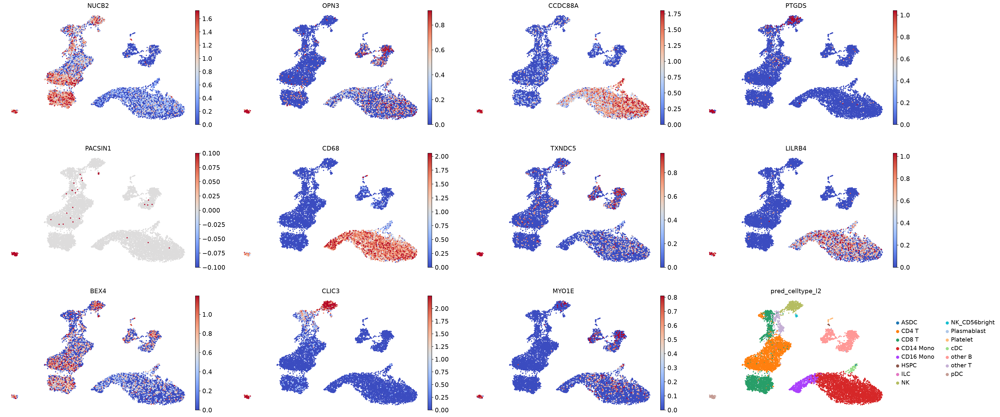

In [53]:
# Visualization of gene importancies on cell embeddings
sc.pl.umap(
    adata,
    color = gene_importances.head(11)['gene_name'].tolist() + ['pred_celltype_l2'],
    frameon = False,
    cmap = 'coolwarm',
    vmax = 'p99',
    size = 30,
    ncols = 4
)

PACSIN1 and PTGDS support a pDC-like identity, while LILRB4 provides additional, although less specific, support.

In [54]:
# Save anndata with predicted annotations
adata.write_h5ad('adata_predicted.h5ad')

In [55]:
import session_info2
session_info2.session_info()

Package,Version
pandas,2.3.3
numpy,2.4.6
scanpy,1.11.5
scparadise,1.2.0
shap,0.49.1
matplotlib,3.11.0
anndata,0.12.16
Component,Info
Python,"3.11.15 (main, Jun 11 2026, 15:20:16) [GCC 14.3.0]"
OS,Linux-6.8.0-138-generic-x86_64-with-glibc2.39
